In [1]:
import os
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.formula.api import ols
from matplotlib.gridspec import GridSpec

In [2]:
# define the path to the data folder
path = Path().resolve()
path_data = path

In [28]:
def combine_csv_files(file_list, output_file):
    # Read NHANES Description IDs
    df_description = pd.read_csv(str(path_data) + '/Data/step_02_07_Fields.csv')
    # field_name,field_description
    # LBDHDL,HDL-cholesterol (mg/dL)

    # Lista para armazenar os DataFrames
    data_frames = []
    
    # Itera sobre cada arquivo na lista
    for file in file_list:
        # Verifica se o arquivo existe
        file = str(path_data) + file
        print(file)
        if os.path.exists(file):
            # Lê o arquivo CSV e adiciona o DataFrame à lista
            df = pd.read_csv(file)
            data_frames.append(df)
        else:
            print(f"File {file} not found.")
    
    # Concatena todos os DataFrames em um único DataFrame
    combined_df = pd.concat(data_frames, ignore_index=True)

    print(combined_df)

    # Adiciona as descrições para Term1 e Term2
    combined_df = combined_df.merge(df_description, left_on='Term1', right_on='field_name', how='left')
    combined_df = combined_df.rename(columns={'field_description': 'Term1_description'})
    combined_df = combined_df.drop(columns=['field_name'])

    combined_df = combined_df.merge(df_description, left_on='Term2', right_on='field_name', how='left')
    combined_df = combined_df.rename(columns={'field_description': 'Term2_description'})
    combined_df = combined_df.drop(columns=['field_name'])

    # Reordena as colunas
    column_order = ['Unnamed: 0',  'Outcome', 'Term1', 'Term1_description', 'Term2', 'Term2_description', 'Converged', 'n', 'pvalue', 'Bonfp', 'pvalue_bonferroni', 'pvalue_fdr']
    combined_df = combined_df[column_order]

    # Salva o DataFrame combinado em um único arquivo CSV
    
    # Salva o DataFrame combinado em um único arquivo CSV
    combined_df.to_csv(str(path_data) + output_file + '.csv', index=False)
    combined_df.to_excel(str(path_data) + output_file + '.xlsx', index=False)
    print(f"Combined CSV saved to {output_file}")

In [29]:
# Lista de arquivos CSV para combinar
file_list_replicte = [
    '/Data/step_06_00/Result_LBDHDD_replicate.csv',
    '/Data/step_06_00/Result_LBDHDL_replicate.csv',
    '/Data/step_06_00/Result_LBDLDL_N_replicate.csv',
    '/Data/step_06_00/Result_LBXHDD_replicate.csv',
    '/Data/step_06_00/Result_LBXSTR_replicate.csv',
    '/Data/step_06_00/Result_LBXTC_N_replicate.csv',
]

In [30]:
# Nome do arquivo CSV de saída
output_file = '/Data/step_07_00_Replicate_Results'

# Chama a função para combinar os arquivos CSV
combine_csv_files(file_list_replicte, output_file)

/Users/andrerico/Works/Projects/pbs_igem/Data/step_06_00/Result_LBDHDD_replicate.csv
/Users/andrerico/Works/Projects/pbs_igem/Data/step_06_00/Result_LBDHDL_replicate.csv
/Users/andrerico/Works/Projects/pbs_igem/Data/step_06_00/Result_LBDLDL_N_replicate.csv
/Users/andrerico/Works/Projects/pbs_igem/Data/step_06_00/Result_LBXHDD_replicate.csv
/Users/andrerico/Works/Projects/pbs_igem/Data/step_06_00/Result_LBXSTR_replicate.csv
/Users/andrerico/Works/Projects/pbs_igem/Data/step_06_00/Result_LBXTC_N_replicate.csv
     Unnamed: 0  Outcome     Term1     Term2 Converged        pvalue  \
0             4   LBDHDD    LBX2DF    LBXVBZ      True  3.179227e-14   
1            23   LBDHDD    LBXVBZ    LBXVFN      True  9.627123e-11   
2            22   LBDHDD    LBXVFN    LBXVBZ      True  9.627123e-11   
3             3   LBDHDD    LBXLNA    LBXAR1      True  1.965819e-10   
4            90   LBDHDD    LBXAR1    LBXPL1      True  2.185864e-10   
..          ...      ...       ...       ...       ... 

STEP 07_02: Analysis Sig Replicate Results

In [3]:
# Read the results from replications
df_results = pd.read_csv(str(path_data / 'Data/step_06_00/ALL_Results_Replicate.csv'))
print(f"{len(df_results)}: Results from replications")

# Keep only significant results
df_results = df_results[df_results['pvalue_bonferroni'] < 0.05]
print(f"{len(df_results)} : Significant results with Bonferroni correction < 0.05")


455: Results from replications
56 : Significant results with Bonferroni correction < 0.05


In [4]:
# Define the groups
list_covariates = ['RIDAGEYR', 'RIAGENDR', 'RIDRETH1', 'BMXBMI', 'Cycle']
list_outcomes = ['LBDLDL_N', 'LBXTC_N', 'LBXSTR', 'LBDHDL', 'LBXHDD', 'LBDHDD']

Processing: LBDLDL_N - LBXIRN - LBXSIR


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


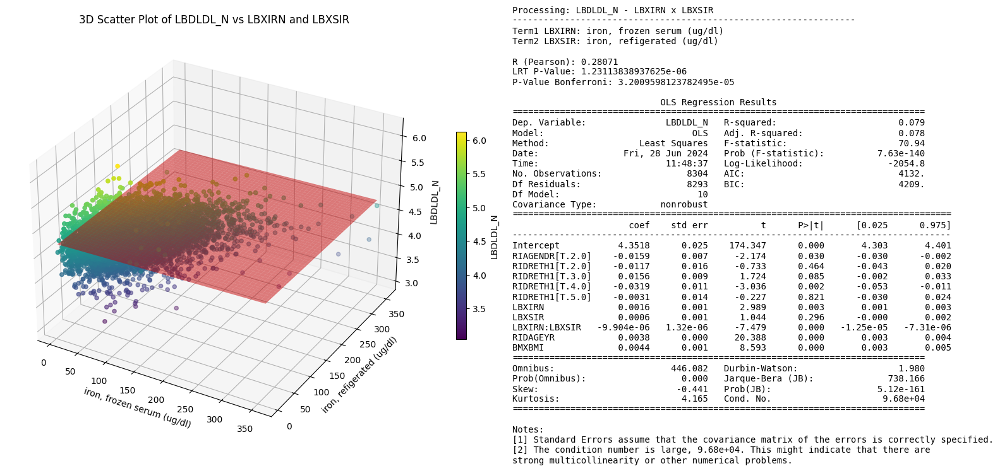

Processing: LBDLDL_N - LBXSBU - URXUCR


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


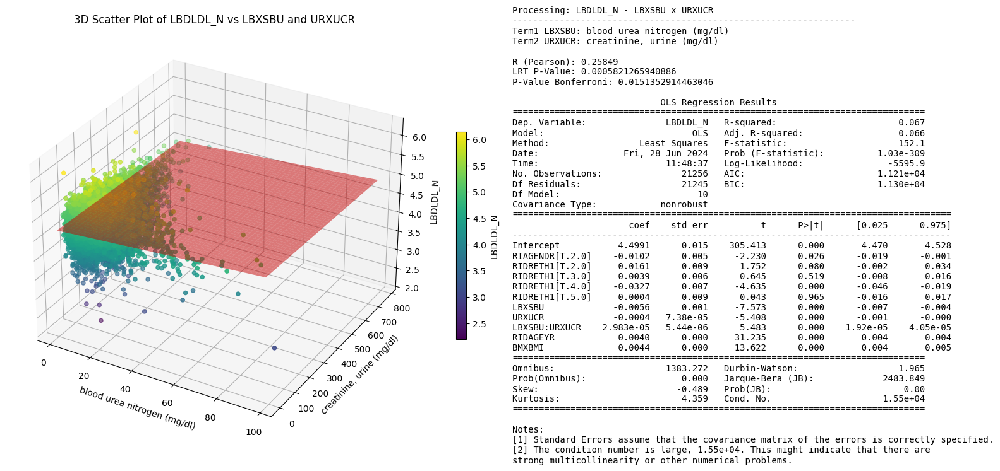

Processing: LBDLDL_N - URXUCR - LBXSBU


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


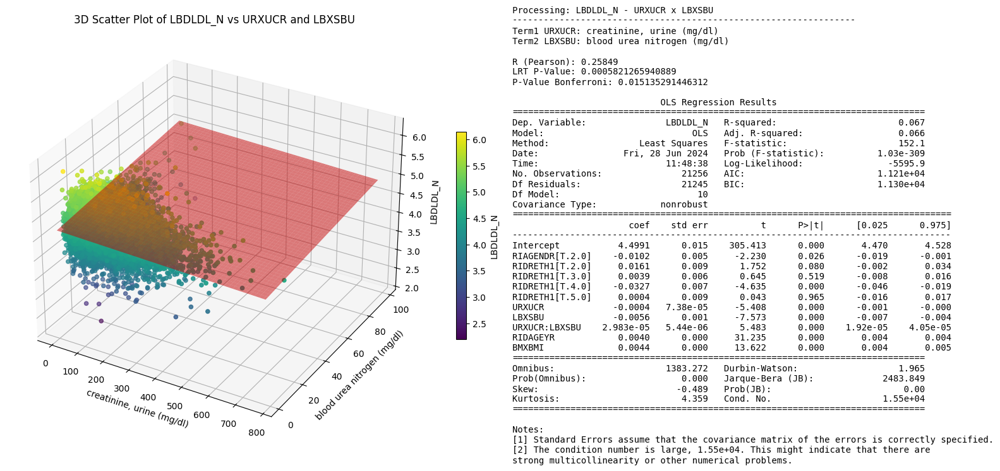

Processing: LBXTC_N - LBXSBU - URXUCR


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


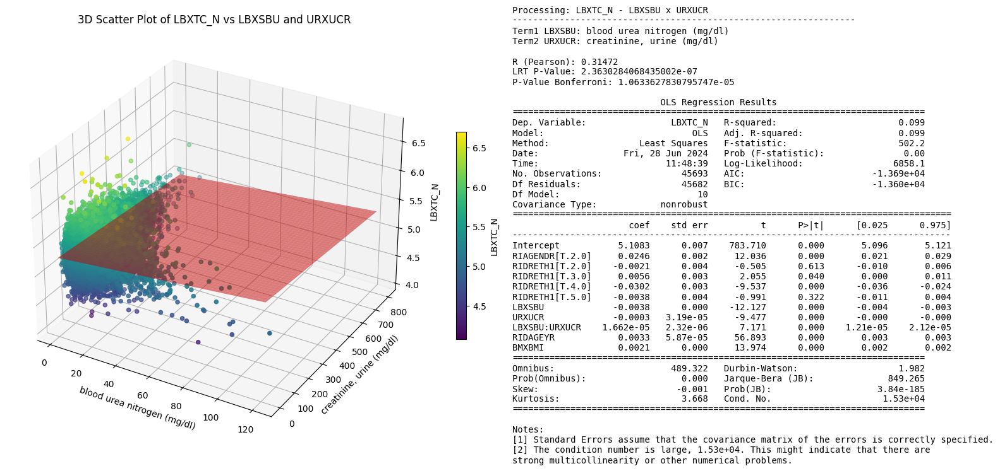

Processing: LBXTC_N - URXUCR - LBXSBU


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


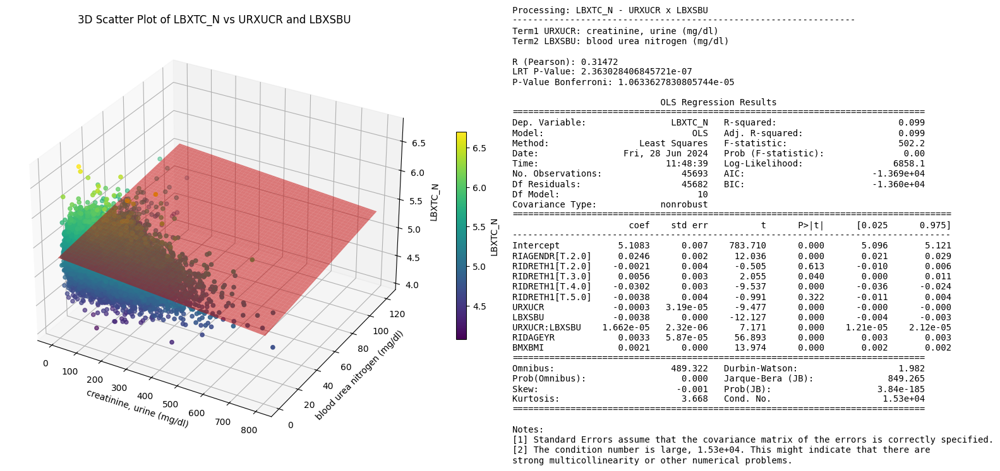

Processing: LBXTC_N - LBDCOTLC - LBXSKSI


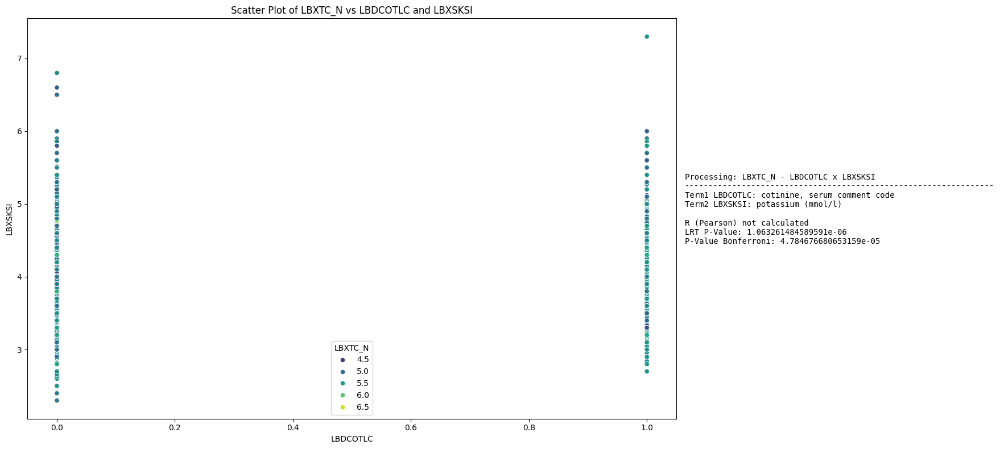

Processing: LBXTC_N - URXUCD - LBXSCA


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


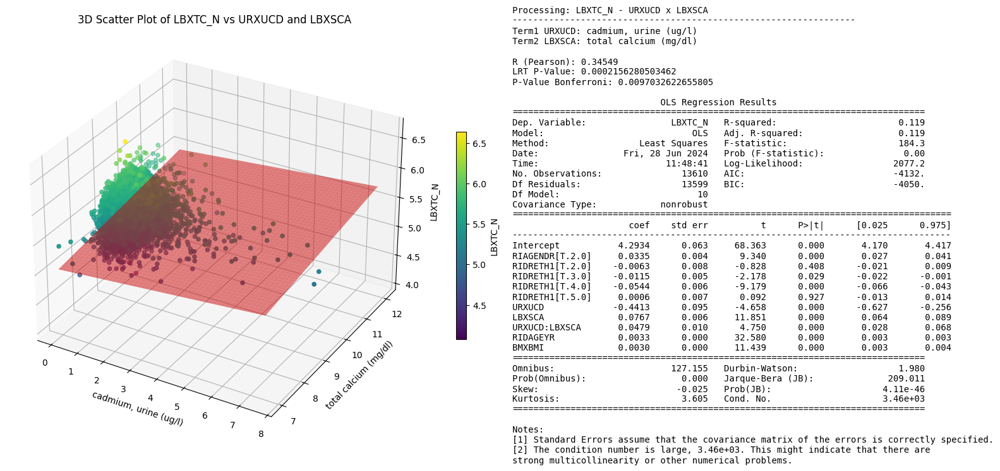

Processing: LBXTC_N - LBXSCA - URXUCD


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


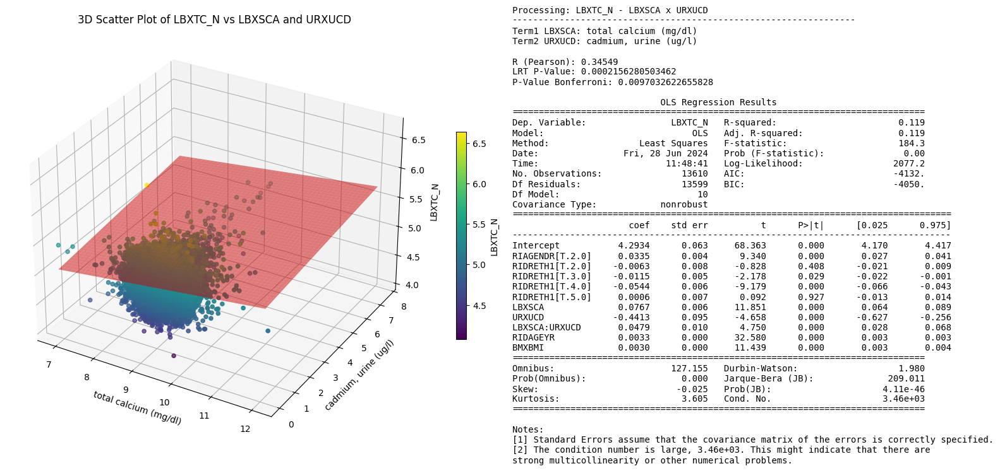

Processing: LBXTC_N - LBDCOTLC - LBXSCA


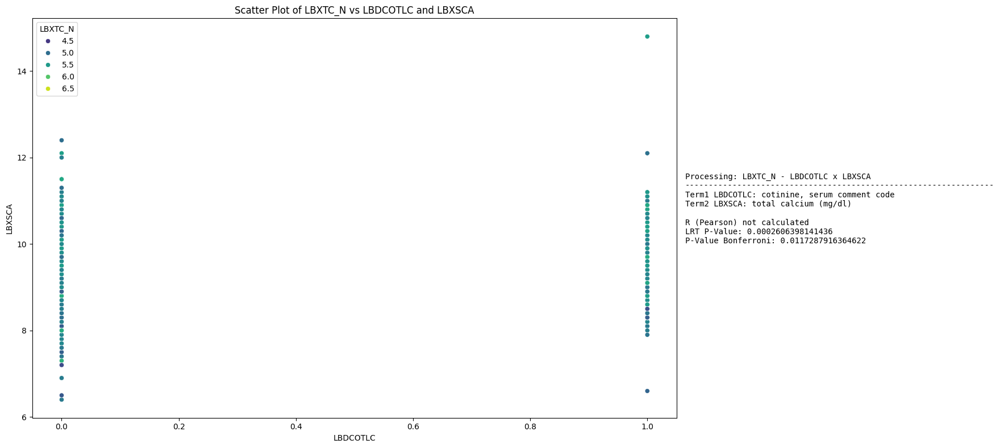

Processing: LBXTC_N - LBXSCA - LBDCOTLC


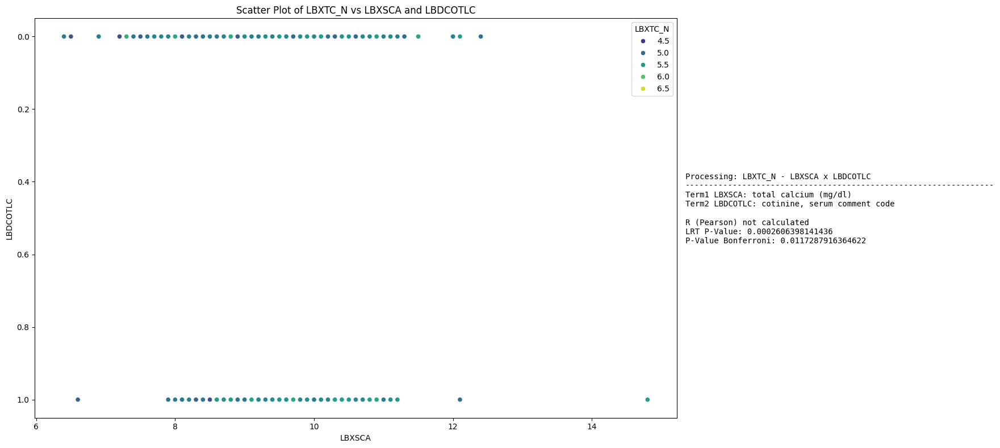

Processing: LBXTC_N - LBXIRN - LBXSIR


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


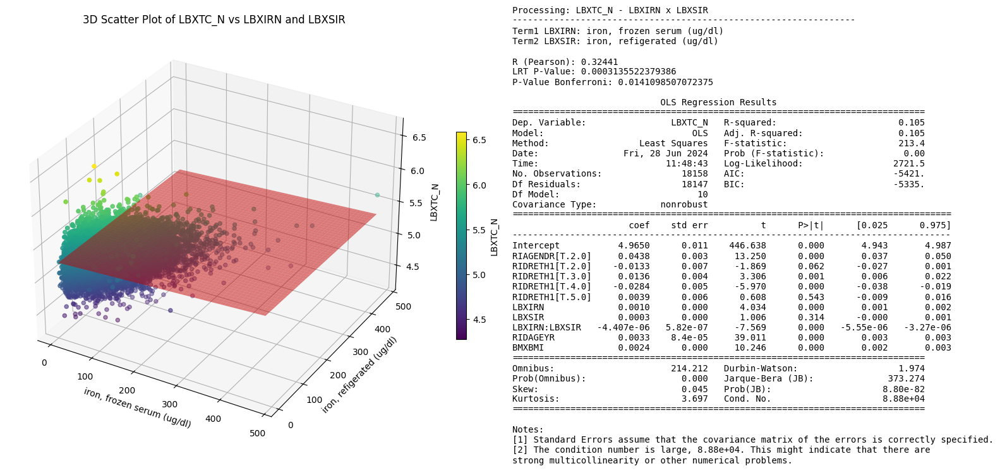

Processing: LBXSTR - LBXSBU - LBXSGL


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


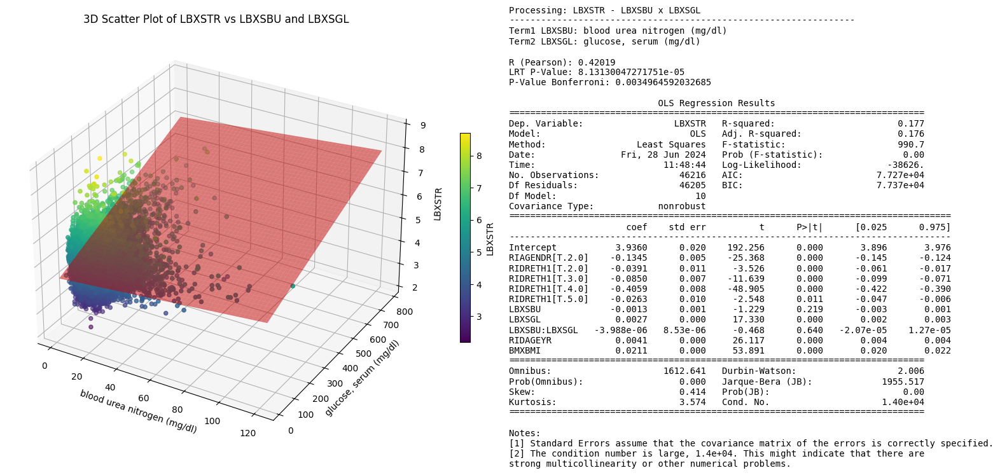

Processing: LBXSTR - LBXSBU - LBXSGL


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


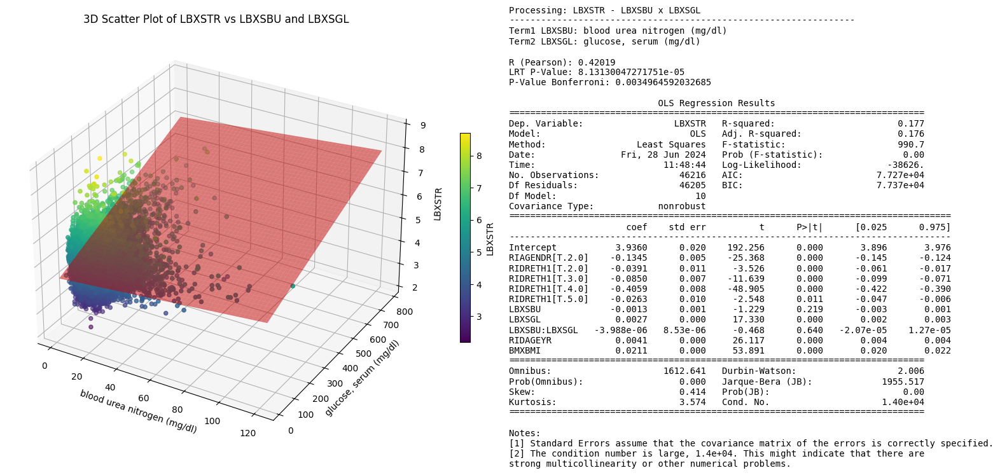

Processing: LBXSTR - LBXSGL - LBXSBU


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


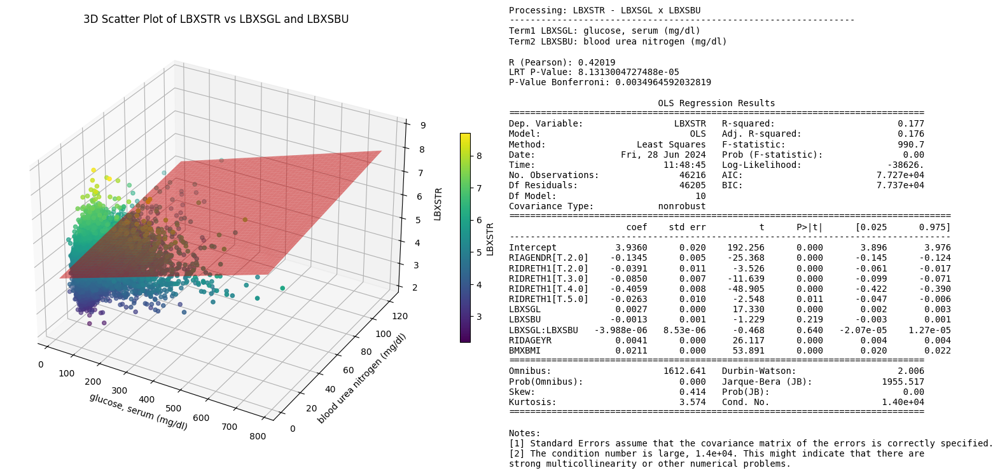

Processing: LBXSTR - LBXSGL - LBXSBU


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


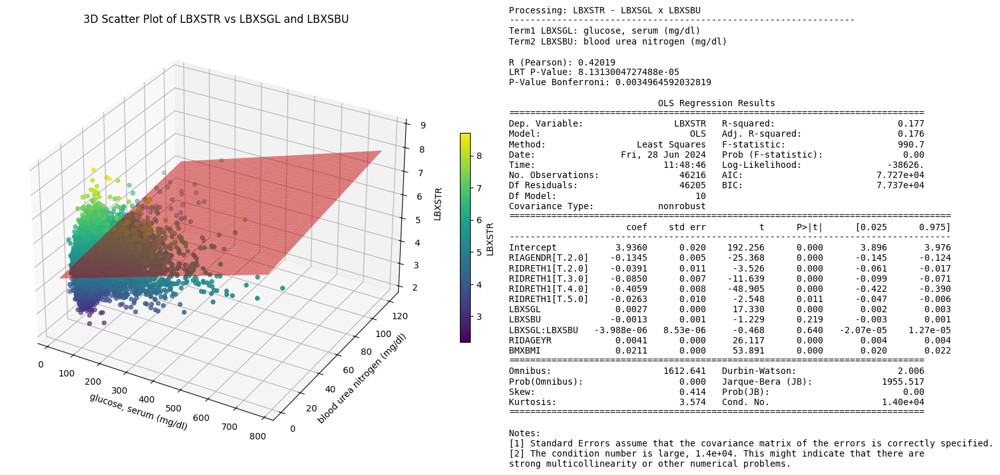

Processing: LBXSTR - LBXSCA - LBXSIR


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


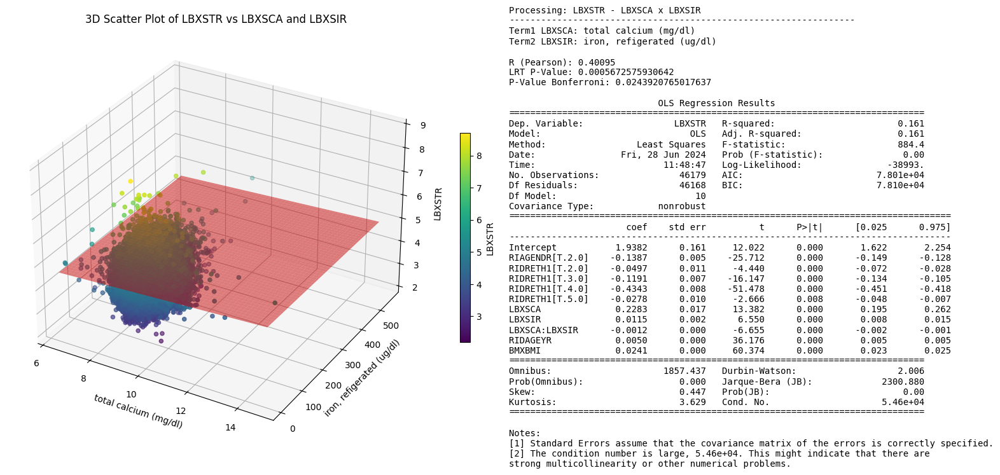

Processing: LBDHDL - LBXBCD - LBXBPB


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


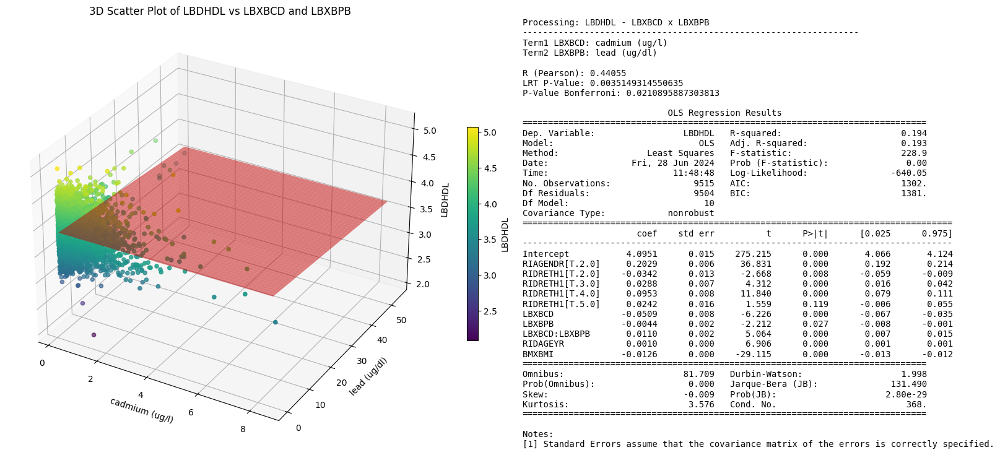

Processing: LBXHDD - SSAR1_N - SSPL1_N


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


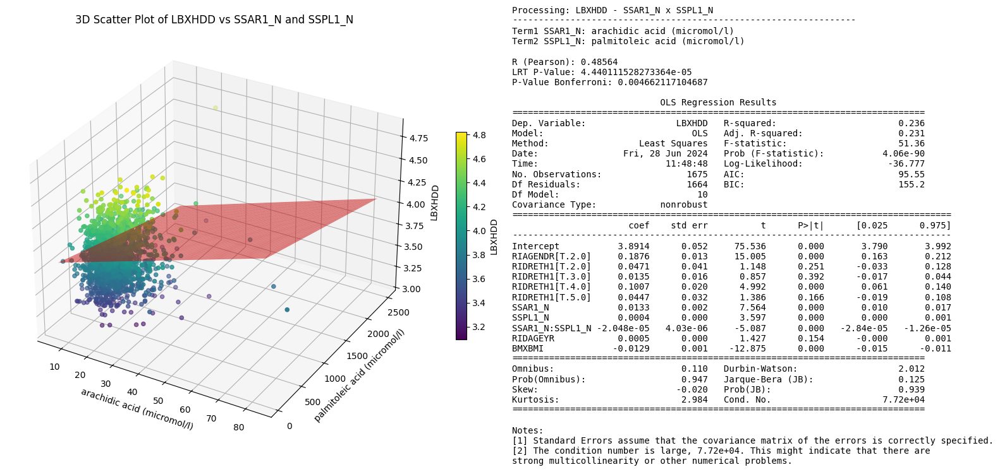

Processing: LBXHDD - LBXBCD - LBXBPB


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


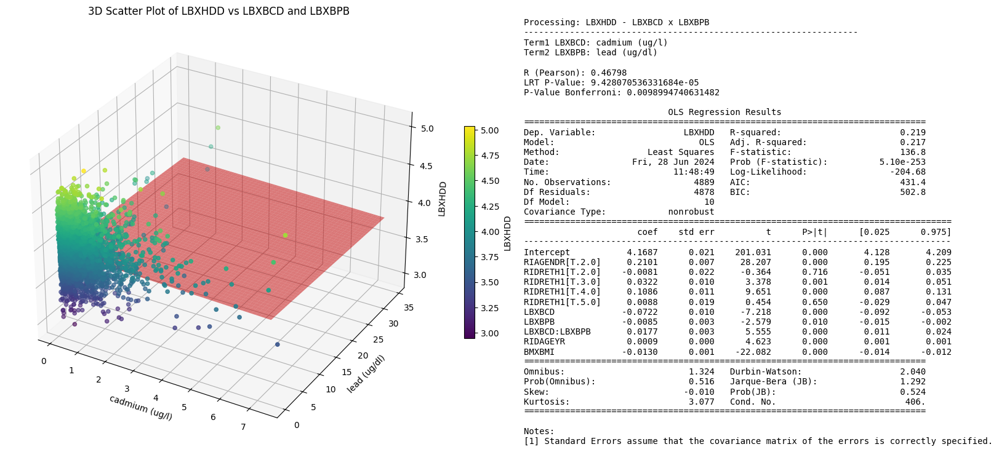

Processing: LBDHDD - LBX2DF - LBXVBZ


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


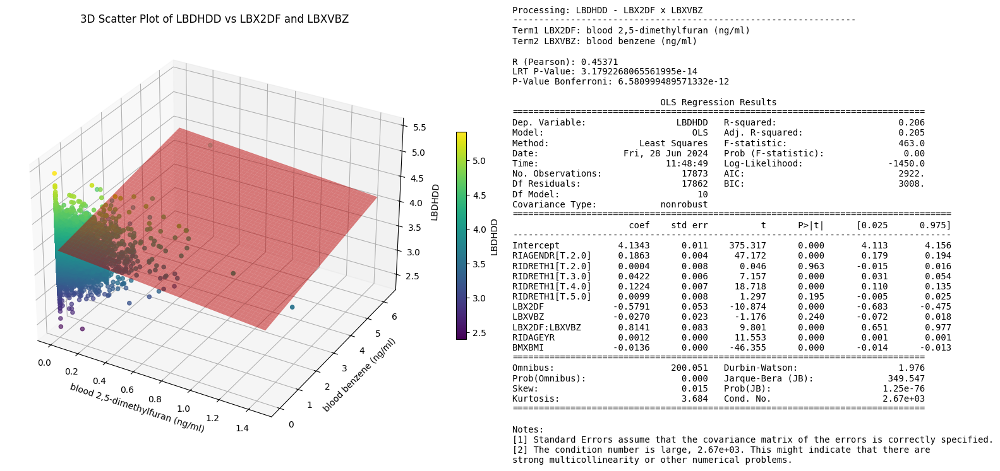

Processing: LBDHDD - LBXVBZ - LBXVFN


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


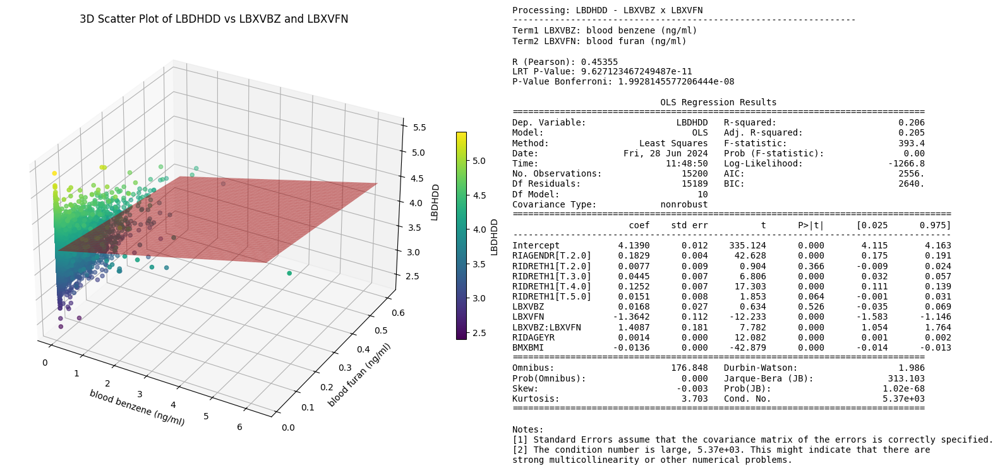

Processing: LBDHDD - LBXVFN - LBXVBZ


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


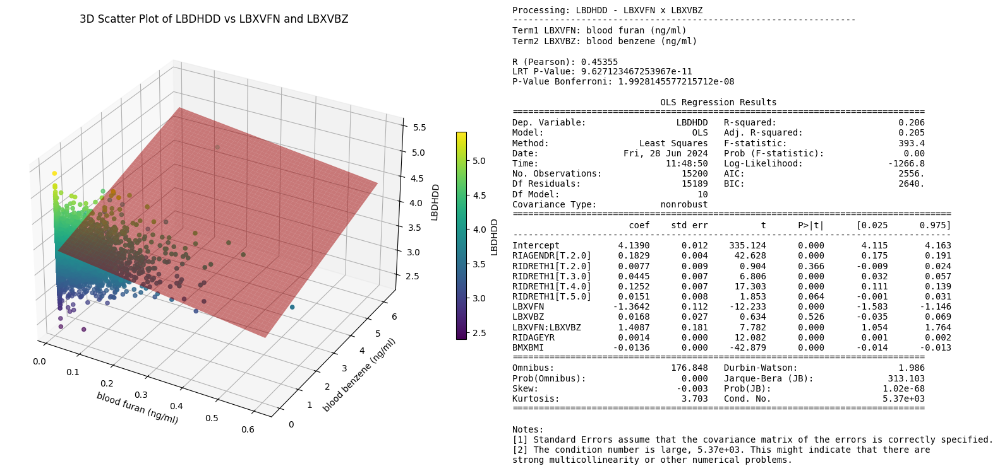

Processing: LBDHDD - LBXLNA - LBXAR1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


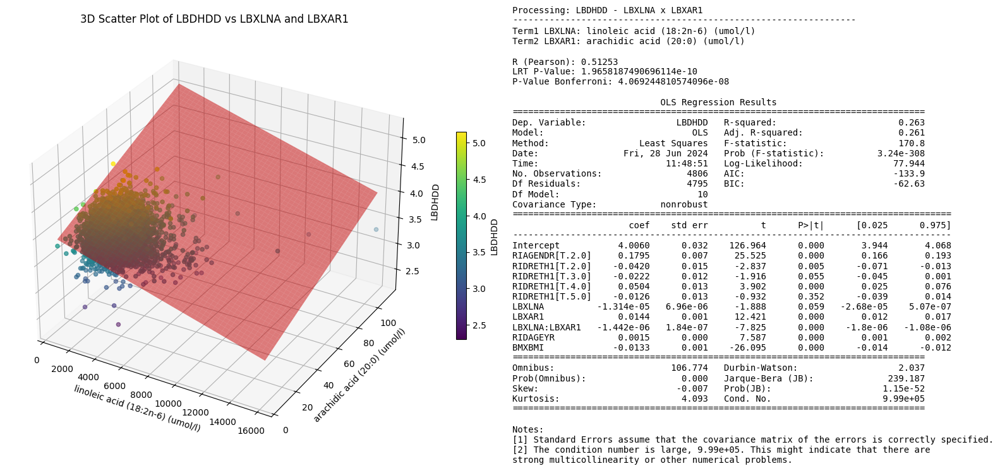

Processing: LBDHDD - LBXAR1 - LBXPL1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


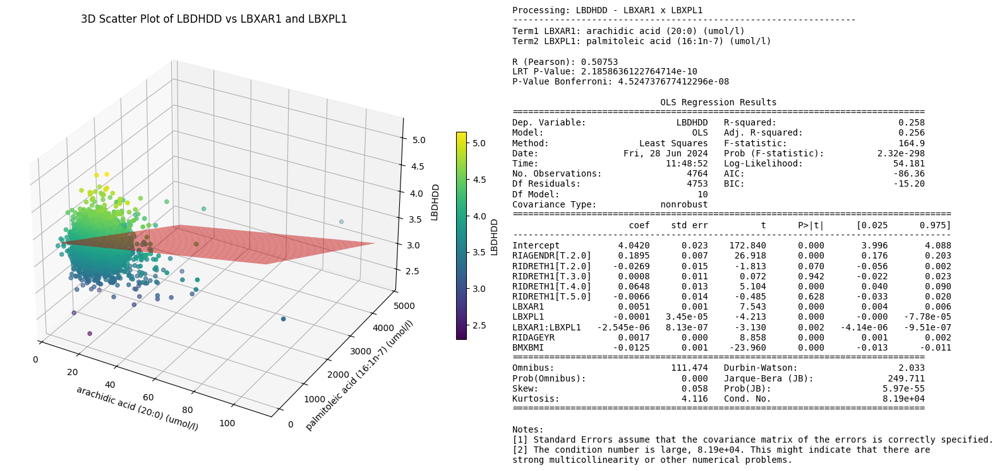

Processing: LBDHDD - LBXLNA - LBXED1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


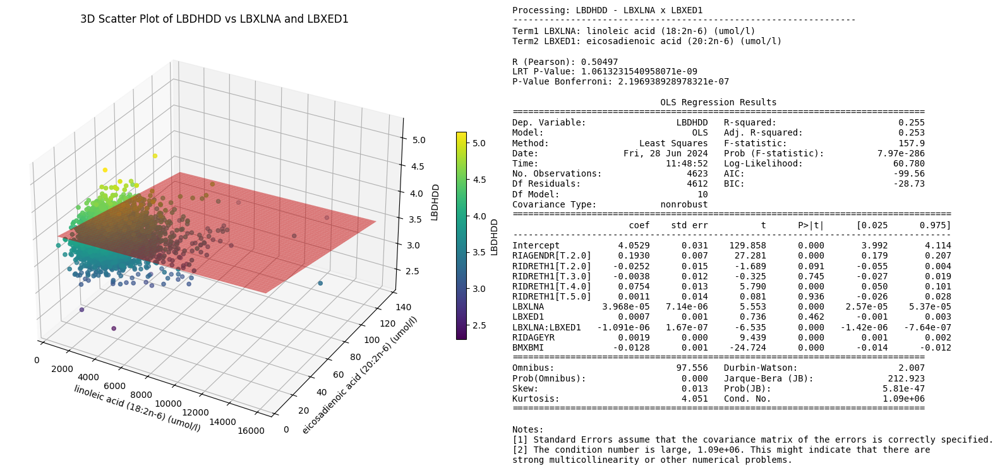

Processing: LBDHDD - LBXPM1 - LBXAR1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


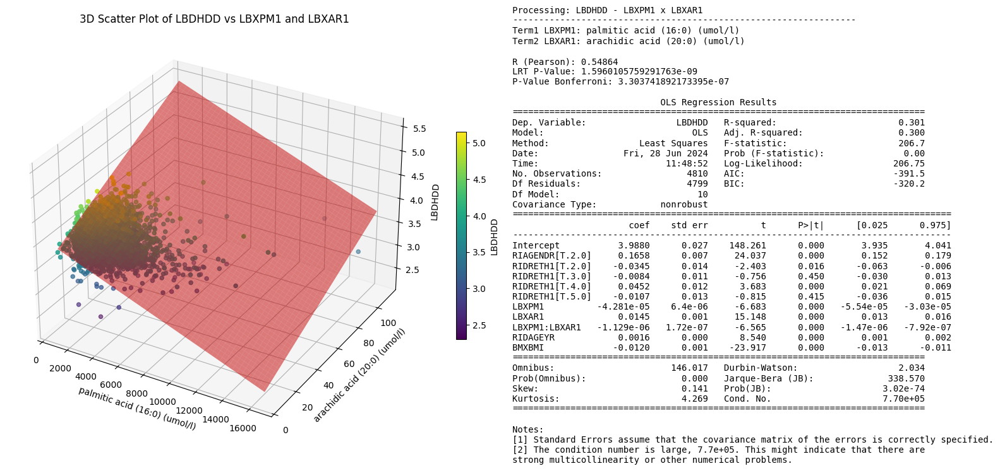

Processing: LBDHDD - LBXST1 - LBXAR1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


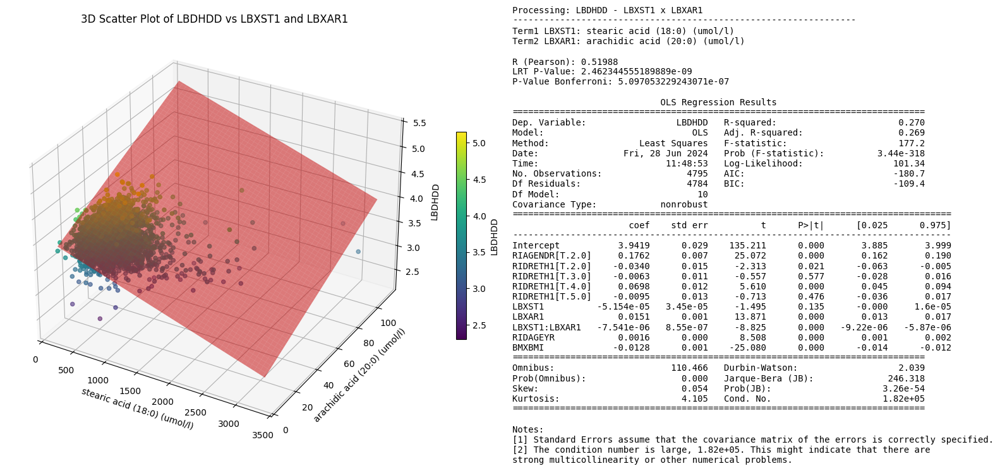

Processing: LBDHDD - LBXDP3 - LBXED1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


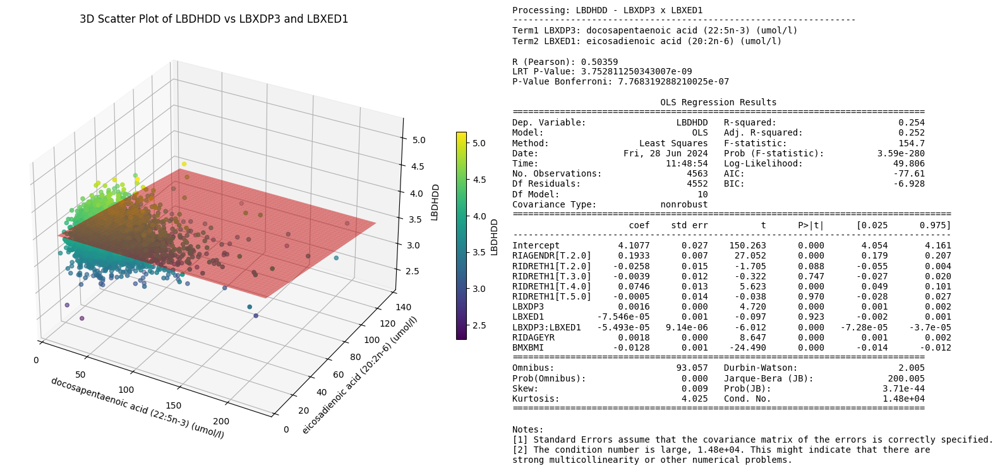

Processing: LBDHDD - URXUHG - LBDIHGLC


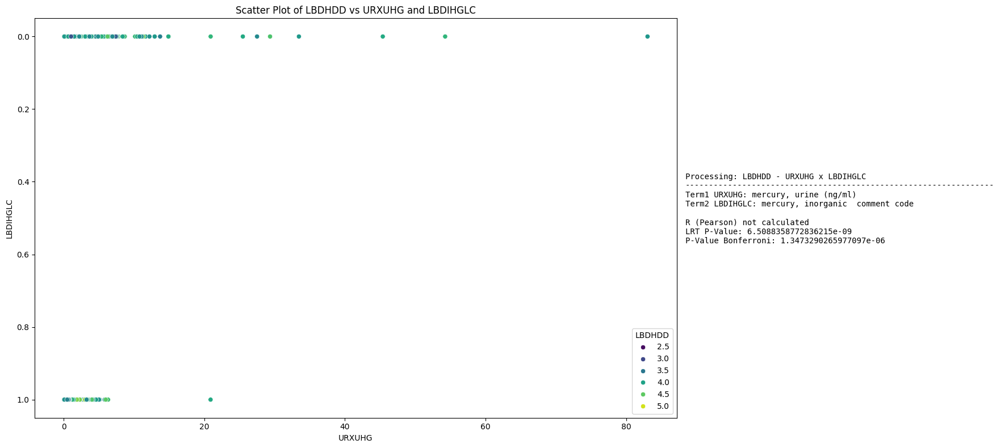

Processing: LBDHDD - LBXDP3 - LBXEPA


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


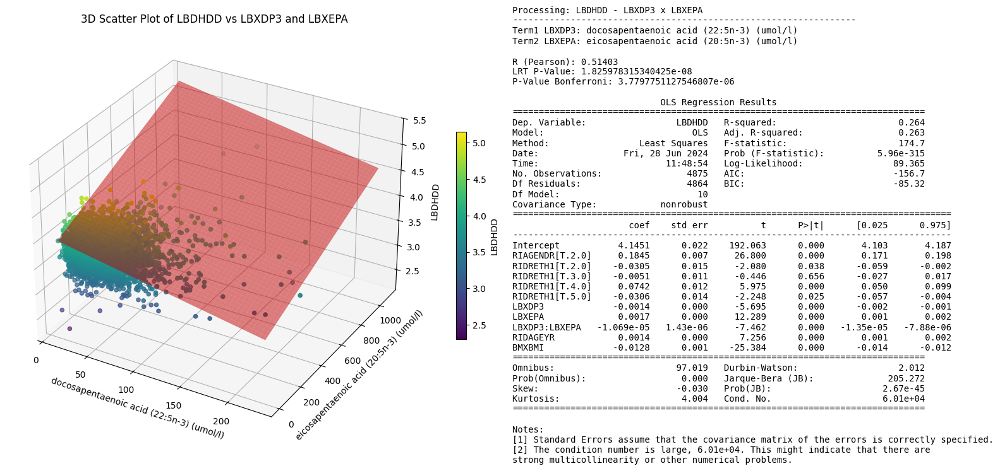

Processing: LBDHDD - LBXST1 - LBXED1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


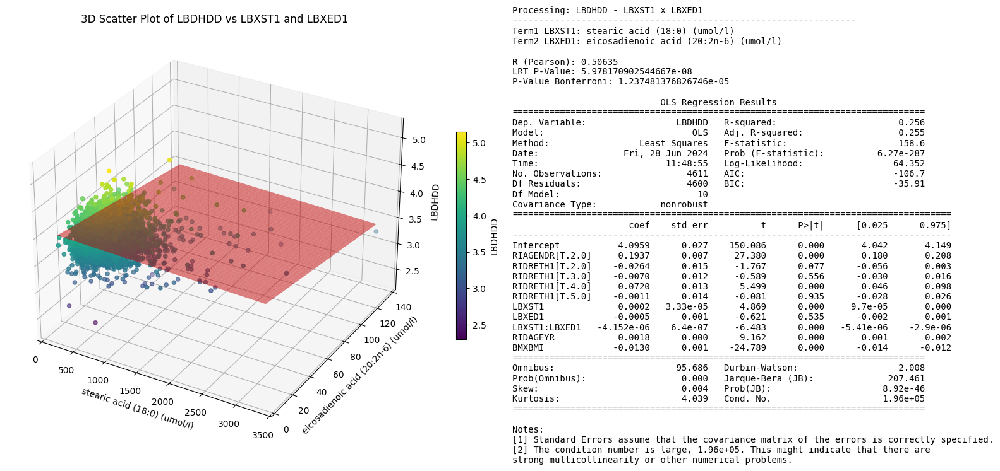

Processing: LBDHDD - LBXDP6 - LBXLNA


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


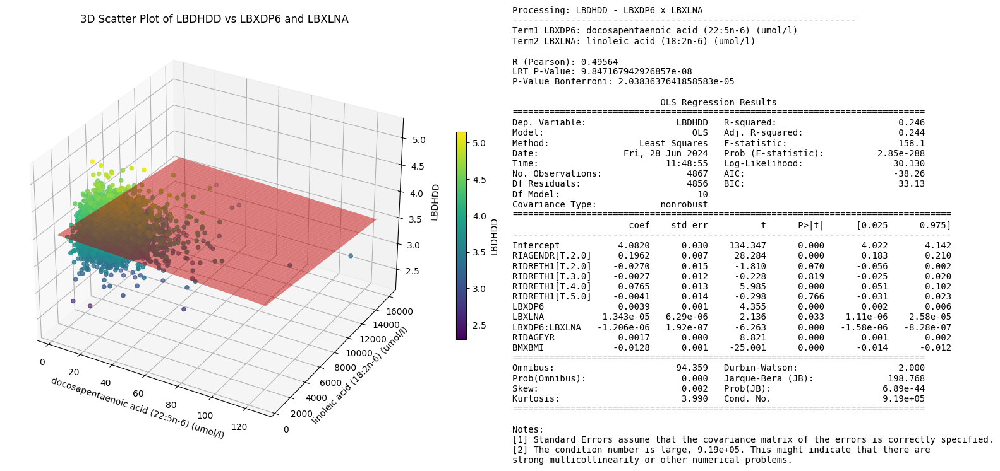

Processing: LBDHDD - LBXOL1 - LBXPM1


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


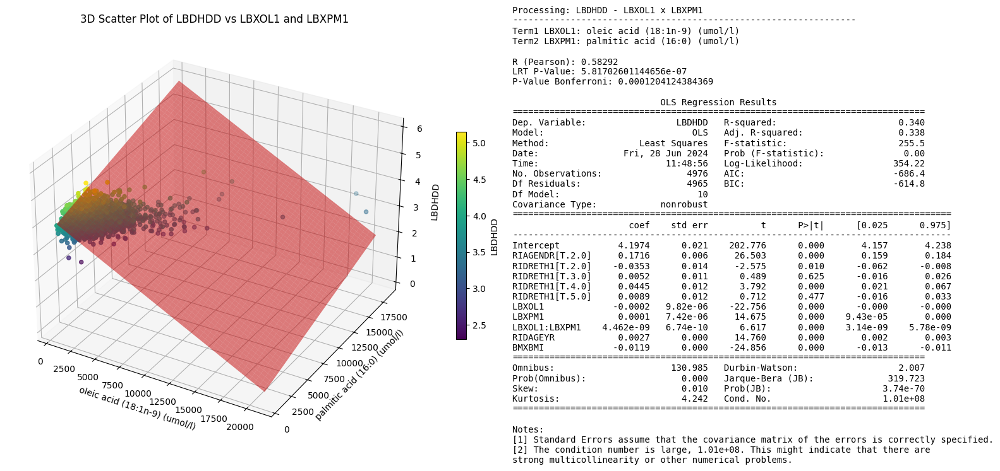

Processing: LBDHDD - LBXLNA - LBXARA


/Users/andrerico/Works/Projects/pbs_igem/.venv/lib/python3.10/site-packages/sklearn/base.py:493: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


KeyboardInterrupt: 

In [8]:
# Loop to process each Outcome
results = []

# list_outcomes = ['LBDLDL_N'] # DEBUG ONLY
# list_outcomes = ['LBXTC_N'] # DEBUG ONLY
for outcome in list_outcomes:

    # Read QC Dataset
    file_name = str(path_data) + "/Data/step_05_05/QC_NHANES_" + outcome + ".pkl"
    df_nhanes = pd.read_pickle(file_name)

    df_results_outcome = df_results[df_results['Outcome'] == outcome]

    # Loop to each significant Outcome result
    for i_mappair in df_results_outcome.index:
        # get Exposomes
        result_details = ''
        e1 = df_results_outcome["Term1"][i_mappair]
        e2 = df_results_outcome["Term2"][i_mappair]

        print(f"Processing: {outcome} - {e1} - {e2}")

        # Get the data
        df_exe = df_nhanes[[e1, e2, outcome] + list_covariates].copy()
        df_exe.dropna(inplace=True)

        # Verificar se e1 e e2 são numéricos
        is_e1_numeric = pd.api.types.is_numeric_dtype(df_exe[e1])
        is_e2_numeric = pd.api.types.is_numeric_dtype(df_exe[e2])

        fig = plt.figure(figsize=(18, 8))
        gs = GridSpec(1, 2, width_ratios=[8, 2])

        # Gráfico à esquerda
        ax1 = fig.add_subplot(gs[0], projection='3d' if is_e1_numeric and is_e2_numeric else None)

        if is_e1_numeric and is_e2_numeric:

            # Preparar os dados para a regressão linear
            X = df_exe[[e1, e2]]
            y = df_exe[outcome]

            # Ajustar o modelo de regressão linear
            reg = LinearRegression()
            reg.fit(X, y)

            # Prever valores de HDL ao longo de um grid de valores de e1 ee2 
            x_surf, y_surf = np.meshgrid(np.linspace(X[e1].min(), X[e1].max(), 100), np.linspace(X[e2].min(), X[e2].max(), 100))
            z_surf = reg.predict(np.c_[x_surf.ravel(), y_surf.ravel()]).reshape(x_surf.shape)

            # Scatter plot 3D
            sc = ax1.scatter(df_exe[e1], df_exe[e2], df_exe[outcome], c=df_exe[outcome], cmap='viridis', marker='o')

            # Adicionar a superfície de tendência
            ax1.plot_surface(x_surf, y_surf, z_surf, color='red', alpha=0.5)

            ax1.set_xlabel(df_results_outcome["Term1_description"][i_mappair])
            ax1.set_ylabel(df_results_outcome["Term2_description"][i_mappair])
            ax1.set_zlabel(outcome)
            ax1.set_title(f'3D Scatter Plot of {outcome} vs {e1} and {e2}')

            # Adicionar barra de cor
            cb = plt.colorbar(sc, ax=ax1, shrink=0.5)
            cb.set_label(df_results_outcome["Outcome"][i_mappair])

            # Right side (Text)
            # Add interaction term to the dataframe
            df_exe['Interaction'] = df_exe[e1] * df_exe[e2]

            # Modelo de regressão linear múltipla com termo de interação
            formula = f'{outcome} ~ {e1} * {e2} + RIDAGEYR + RIAGENDR + RIDRETH1 + BMXBMI'
            model = ols(formula, data=df_exe).fit()

            # Obter R^2 do resumo do modelo
            r_squared = model.rsquared

            # Calcular R a partir de R^2
            r = np.sqrt(r_squared)

            # Right side (Text)
            result_details = f"Processing: {outcome} - {e1} x {e2}\n"
            result_details += f"-----------------------------------------------------------------\n"

            result_details += f"Term1 {df_results_outcome['Term1'][i_mappair]}: {df_results_outcome['Term1_description'][i_mappair]}\n"
            result_details += f"Term2 {df_results_outcome['Term2'][i_mappair]}: {df_results_outcome['Term2_description'][i_mappair]}\n\n"

            result_details += f"R (Pearson): {r:.5f}\n"
            result_details += f"LRT P-Value: {df_results_outcome['pvalue'][i_mappair]}\n"
            result_details += f"P-Value Bonferroni: {df_results_outcome['pvalue_bonferroni'][i_mappair]}\n\n"


            # Model Summary
            summary_text = result_details + model.summary().as_text()

            # Add text to the right side
            ax2 = fig.add_subplot(gs[1])
            ax2.axis('off')
            ax2.text(0, 0.5, summary_text, fontsize=10, family='monospace', verticalalignment='center')

        else:
            # Plot para dados categóricos
            sns.scatterplot(data=df_exe, x=e1, y=e2, hue=outcome, palette='viridis', ax=ax1)

            ax1.set_xlabel(e1)
            ax1.set_ylabel(e2)
            ax1.set_title(f'Scatter Plot of {outcome} vs {e1} and {e2}')
            ax1.legend(title=outcome)

            # Right side (Text)
            result_details = f"Processing: {outcome} - {e1} x {e2}\n"
            result_details += f"-----------------------------------------------------------------\n"

            result_details += f"Term1 {df_results_outcome['Term1'][i_mappair]}: {df_results_outcome['Term1_description'][i_mappair]}\n"
            result_details += f"Term2 {df_results_outcome['Term2'][i_mappair]}: {df_results_outcome['Term2_description'][i_mappair]}\n\n"

            result_details += f"R (Pearson) not calculated\n"
            result_details += f"LRT P-Value: {df_results_outcome['pvalue'][i_mappair]}\n"
            result_details += f"P-Value Bonferroni: {df_results_outcome['pvalue_bonferroni'][i_mappair]}\n\n"
 
            summary_text = result_details

            # Add text to the right side
            ax2 = fig.add_subplot(gs[1])
            ax2.axis('off')
            ax2.text(0, 0.5, summary_text, fontsize=10, family='monospace', verticalalignment='center')
        
        
        plt.tight_layout()
        plt.show()